In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D as ax3
from tqdm import tqdm
import imageio as im
from IPython.display import Image

In [3]:
def LotkaVolterra(i0,t,a,b,d,g):
    didt = np.zeros(2) #initialize array; each element is a derivative of y [x,y,vx,vy]
    didt[0] = a*i0[0]-b*i0[0]*i0[1]
    didt[1] = d*i0[0]*i0[1]-g*i0[1]
    return didt

def RK2(diffeq, i0, t, h,a,b,d,g):
    k1 = h*diffeq(i0, t,a,b,d,g)
    k2 = h*diffeq(i0 + 0.5*k1, t+h/2,a,b,d,g)
    return i0 + k2


## The Lotka Volterra Equations as an Example of Hopf Bifurcation

## Chapter 1: The Model

The Lotka-Volterra equations are a set of differential equations used to model predator-prey interaction in a given ecosystem.

Lotka Volterra Equations:

$\frac{dx}{dt}=\alpha x - \beta xy$

$\frac{dy}{dt}=\delta xy - \gamma y$

Where, for each, $x$ is the prey density, $y$ is the predetor density, the greek variables $\alpha, \beta, \gamma, \delta$ are constants describing the interactions between the two species.

The equations functionally model two different forms of the nature of predator-prey interaction: the stable and unstable forms.

In the stable form of the Lotka-Volterra model, predator-prey population densities are periodic, growing and shrinking depending on the relationship between the coefficients. The stable form is characterized by an $\alpha > 0$.

The unstable form of the equations, on the other hand, appears due to some instability in the system resulting in the eventual extinction of one or both of the species. The unstable mode is characterized by an $\alpha < 0$.

This transition of modes appears as $\alpha$ transitions from positive to negative or vice-versa. At $\alpha = 0$, though, we see a third mode--a stable, non-periodic system for which both populations stay constant and non-zero.

This transition point of the system's stability at $\alpha = 0$ is an example of a Hopf Bifurcation.

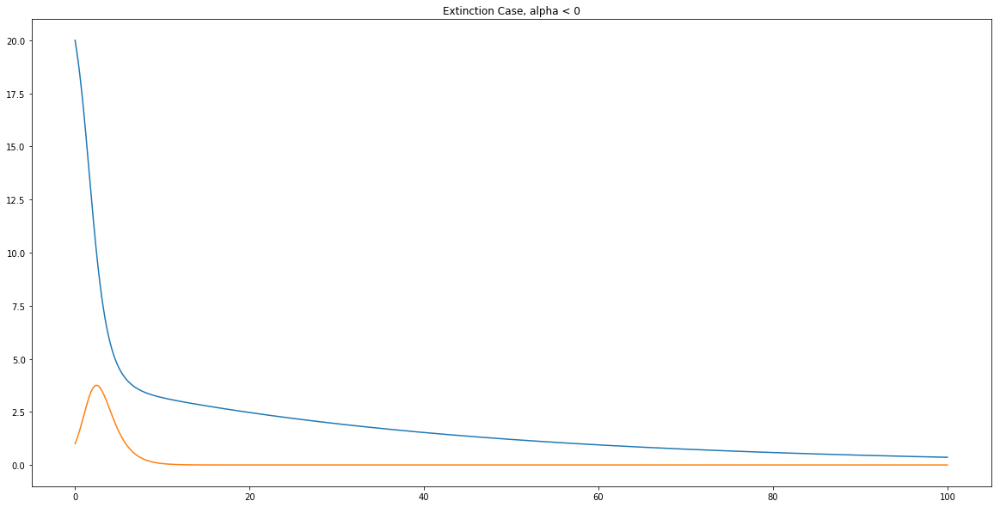

In [3]:
Image(filename='case1.png')

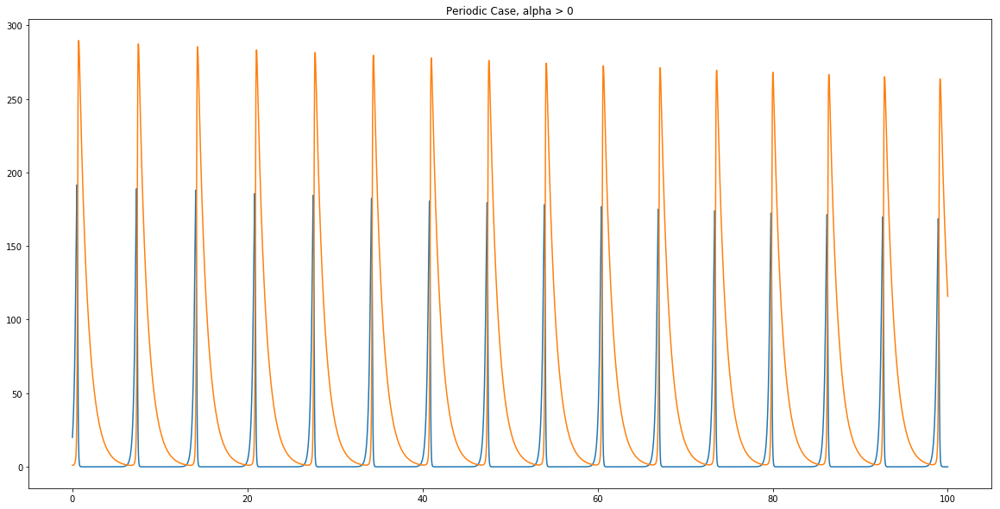

In [4]:
Image(filename='case2.png')

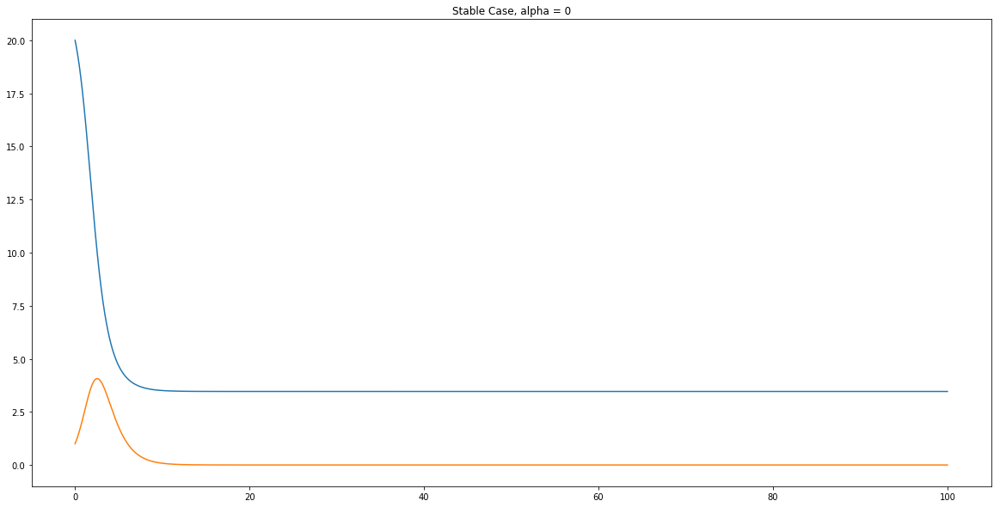

In [5]:
Image(filename='stablecase.png')

## Chapter 2: Variables and their Effects on Various Initial Conditions

Observations:

While changes in the $\alpha$ variable cause state and stability changes, the other variables $\delta, \beta$ and the initial population densities $x_{0},y_{0}$ cause changes in the frequency of the system.

This frequency is given by the following equation:

$\omega = \sqrt{\alpha \gamma}$

with its relation to the period given by:

$\omega = \frac{2\pi}{T}$

where T is the period of the system.

From this, we can see that if $\alpha$ or $\gamma$ is negative (the non-periodic case), then the system has an imaginary periodicity! This gives us our different cases. Let's set our $\alpha \gamma$ to be $(2\pi)^2$ to see what a period of 1 time-unit will look like:

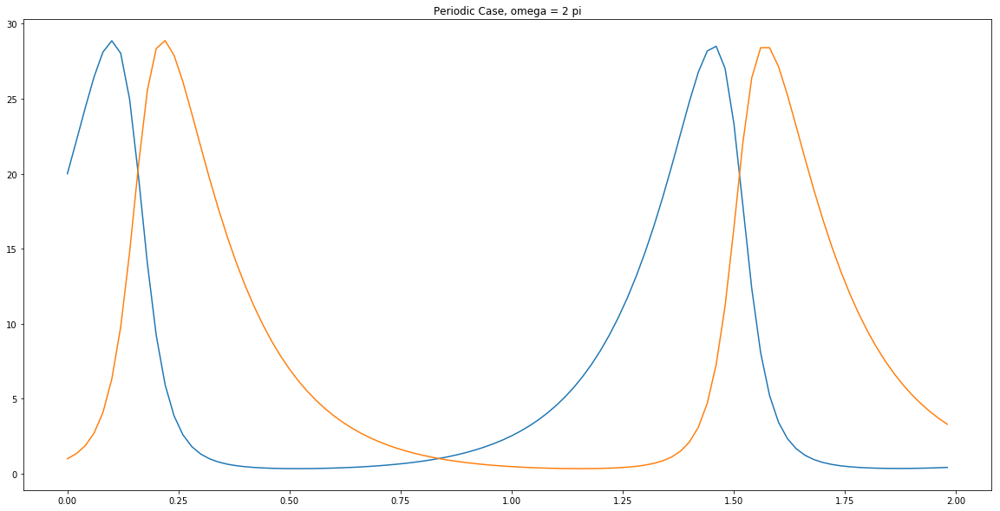

In [6]:
Image(filename='periodplot.png') 

With this control of the period in mind, we can look into the effects of the other variables in the system, $\beta , \delta$.

The following animation shows what happens when beta is ramped from 0 to around 0.05.

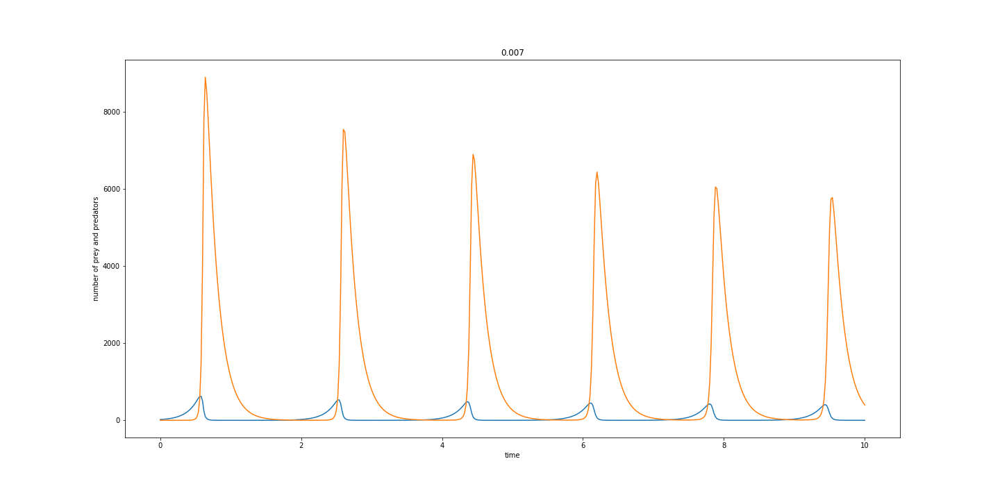

In [7]:
Image(filename='betaramp.gif') 

This animation shows that as beta grows, the peaks in the size of the predator population significantly shrink to meet the size of the peaks in the prey population.

The delta variable has the opposite effect, as seen below:

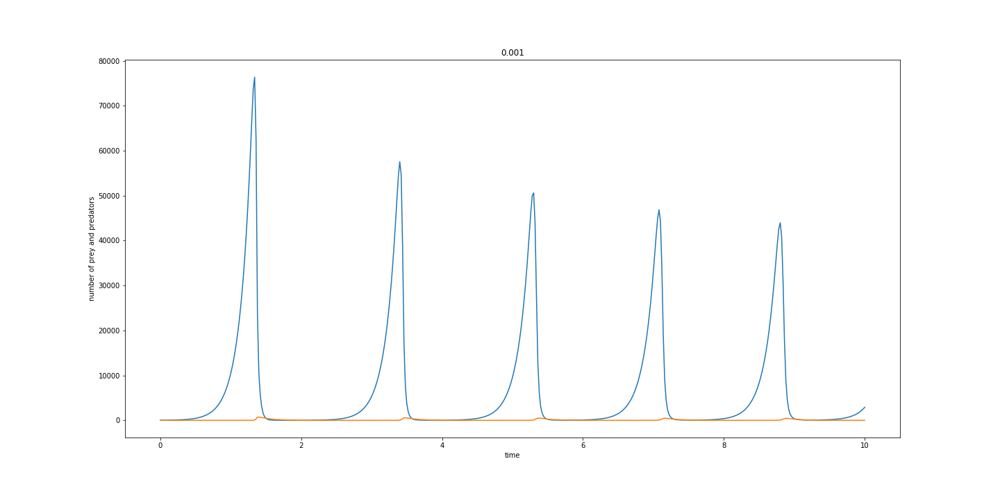

In [8]:
Image(filename='deltaramp.gif') 

In ramping delta from 0 to 0.05, the prey population shrinks to meet the comparitively lower peaks in the predator population.

## Chapter 3: Phase Plots and their Corresponding Attractors

While previously we've only viewed plots demonstrating the periodic (or nonperiodic) nature of the system, another useful plot in characterizing the system's behaviour is a sort of "phase plot". The phase used here is the time-independant predetor population density-vs-prey population density plot. These elliptical plots show the periodic nature of the system, as seen in this first plot.

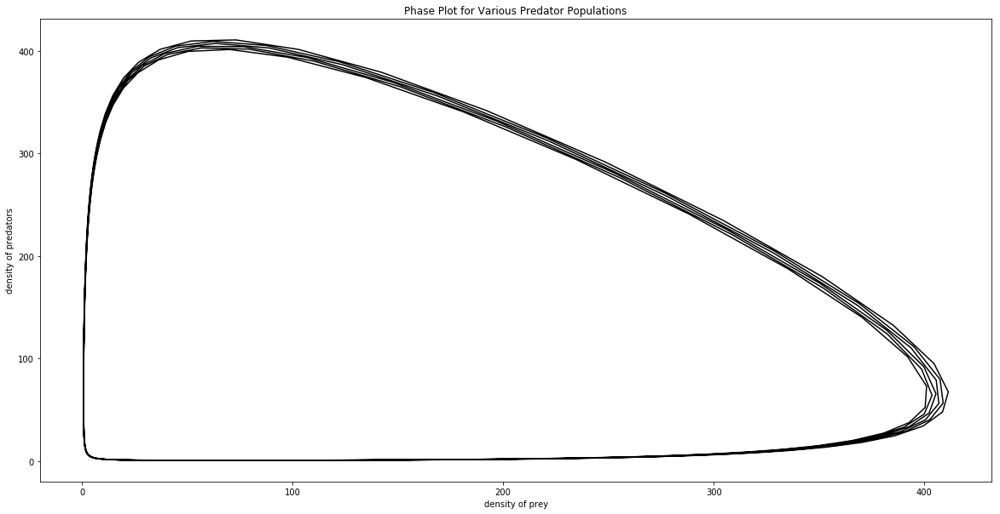

In [55]:
Image(filename='ellipseplot.png') 

However, if the population of the predators is ramped up over time, the phase plot spirals in towards an attractor point, as seen here as the predator population ramps up from an initial value of 1:

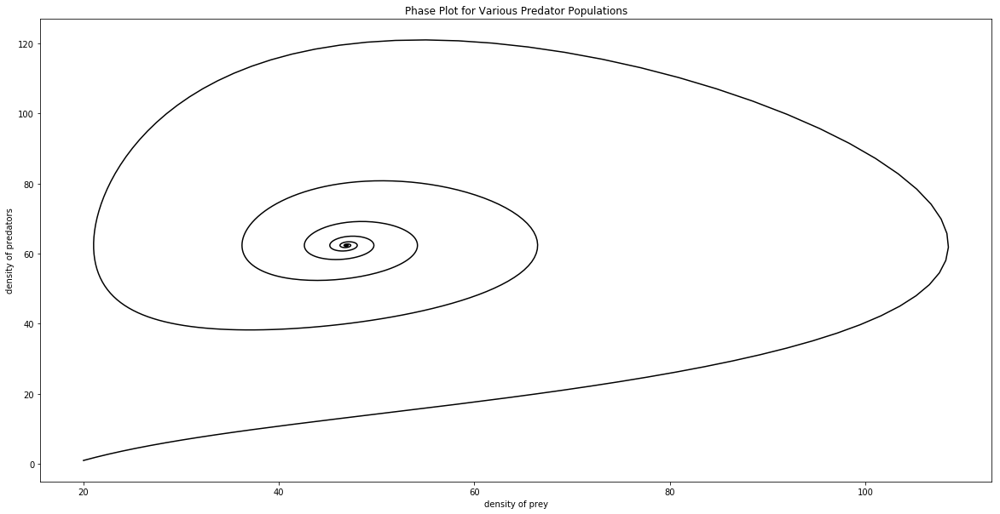

In [57]:
Image(filename='attractorplot.png') 

The value of the fixed point that the system spirals in on is given by the coordinate $(\frac{\gamma}{\delta},\frac{\alpha}{\beta})$. For these initial conditions, that attractor value is:

[46.92817606482344] [62.3354866330416]

## PLOTTING CELLS ---------------------------------------------------------

Below is the cells used to create the above plots.

In [62]:
h = 0.01
x0 = 20

y0 = 1
dy = 1

#PARAMETERS FOR THE ORIGINAL LOTKA VOLTERRA EQUATIONS
a=2*np.pi
b=0.1
d=0.1
g=2*np.pi

#da = 0.001
#a= 2*np.pi - da
#a0 = a

#b0 = 0
#b= 0
#db = 0.001

#d0 = 0
#d= 0
#dd = 0.001

#g0 = -0.025
#g= 1
#dg = 0.001

t = 0
print(a)

6.283185307179586


[46.92817606482344] [62.3354866330416]
62.83185307179586
62.83185307179586


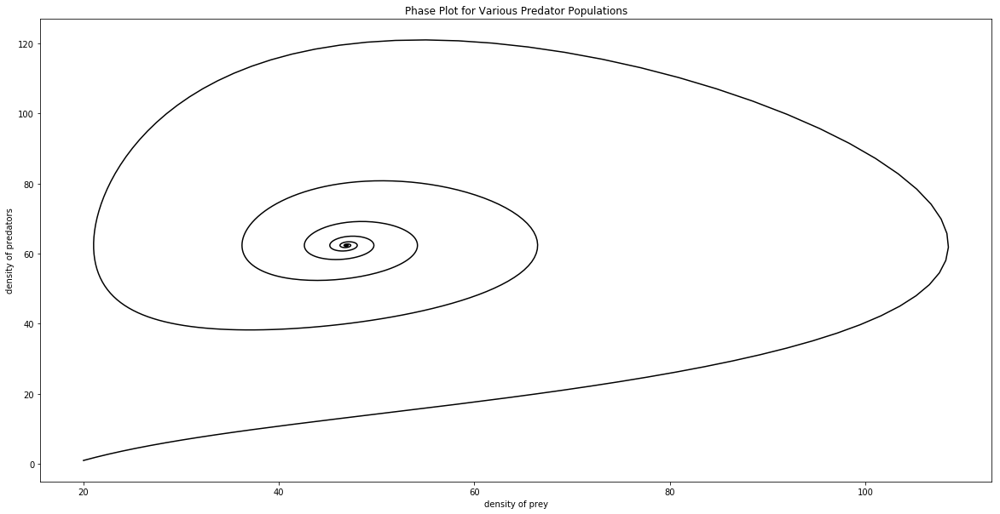

In [63]:
i0 = [x0,y0]

images = []
ta,xn,yn = [],[],[]

lengthlist = np.linspace(0,1000,1000)
images = []

for i in np.linspace(0,1,1):
    ta, xn, yn = [],[],[]
    #i0 = [x0,y0]
    i1 = []
    
    #a = a + da
    #b = b + db
    #d = d + dd
    #g = g + dg
    #i0[1] = i0[1] + dy
    
    while t < 100:
        ta.append(t)
        xn.append(i0[0])
        yn.append(i0[1])
    
        #for phase plot attractor creation
        i0[1] = i0[1] + dy
        
        i1 = RK2(LotkaVolterra,i0,t,h,a,b,d,g)
              
        for i in range(len(i1)):
            i0[i] = i1[i]
        
        t = t+h
    
    t = 0
        
    plt.figure(figsize=[20,10])
    
    #periodic plot
    #plt.plot(ta,xn)
    #plt.plot(ta,yn)
        
    #phase plot
    plt.plot(xn,yn,'k')
    print(xn[9999:],yn[9999:])
    print(g/d)
    print(a/b)
    #print(len(xn))
    
    plt.title('Phase Plot for Various Predator Populations')
    
    #for periodic plot
    #plt.ylabel('number of prey and predators')
    #plt.xlabel('time')
    
    #for phase plot
    plt.xlabel('density of prey')
    plt.ylabel('density of predators')
    
    
    ##This is the code used to make the MP4 below
    plt.savefig('frame.png')
    images.append(im.imread('frame.png'))
    im.mimsave('deltaramp.gif',images)
    
    plt.show()
    plt.close()

#a = a0
#b = b0
#d = d0
#g = g0
i0[1] = y0